In [1]:
import pandas as pd
import numpy as np
import pydeck as pdk
from ceto.analysis import cluster_paths, generate_representative_route, to_pydeck, get_cluster_colors
from ceto.imo import *
import matplotlib.pyplot as plt

In [68]:
from ceto.analysis import haversine

def route_to_voyage_profile(route, design_draft):
# Make voyage_profile from representative route
    vp = {
        "time_anchored": 0.0,
        "time_at_berth": 0.0,
        "legs_manoeuvring":[],
        "legs_at_sea": [],
    }
    for speed, distance in zip(route["speed"], route["distance"]):
        key = "legs_manoeuvring" if speed < 5.0 else "legs_at_sea"
        vp[key].append((distance, speed, design_draft))
    return vp

def trip_to_voyage_profile(trip, design_draft):
    vp = {
        "time_anchored": 0.0,
        "time_at_berth": 0.0,
        "legs_manoeuvring":[],
        "legs_at_sea": [],
    }

    for i in range(len(trip["path"])):
        if i > 0:
            segment_distance_nm = haversine(trip["path"][i], trip["path"][i-1]) / 1_852
            segment_time_h = (trip["timestamp"][i] - trip["timestamp"][i-1]) / 3_600
            segment_speed_kn = segment_distance_nm / segment_time_h

            key = "legs_manoeuvring" if segment_speed_kn < 5.0 else "legs_at_sea"
            vp[key].append((segment_distance_nm, segment_speed_kn, design_draft))
                
    return vp

def get_total_fuel_consumption(inst_fc, timestamps):
    """
    Calculate the total fuel consumption over a period of time based on instantaneous fuel consumption measurements.

    Parameters
    ----------
    inst_fc : array_like
        Array of instantaneous fuel consumption measurements in liters per hour (L/h).
    timestamps : array_like
        Array of Unix timestamps corresponding to the instantaneous fuel consumption measurements.

    Returns
    -------
    float
        The total fuel consumption over the time period, in liters (L).

    Notes
    -----
    This function assumes that the instantaneous fuel consumption measurements are evenly spaced in time.
    """

    # Calculate the time interval between adjacent measurements
    dt = np.diff(timestamps) / 3600

    # Calculate the average fuel consumption between adjacent measurements
    fc_avg = np.convolve(inst_fc, np.array([0.5, 0.5]), mode='valid')

    # Calculate the total fuel consumption by summing the product of the average fuel consumption and time interval
    total_fc = np.sum(fc_avg * dt)

    return total_fc

In [2]:
DJURGÅRDEN = {
    "length": 27.86, # meters
    "beam": 6.9, # meters
    "design_speed": 9.0,  # knots
    "design_draft": 2.3,  # meters
    "double_ended": False, # True or False
    "number_of_propulsion_engines": 1,
    "propulsion_engine_power": 257.0, # per engine kW
    "propulsion_engine_type": "MSD",
    "propulsion_engine_age": "after_2000",
    "propulsion_engine_fuel_type": "MDO",
    "type": "miscellaneous-other",
    "size": 132, # GT
}


In [3]:
file_path = 'data/2022-11-20 - Djurga╠èrden 11 2 dagar mer vind.csv'
stop_duration = 0.5  # minutes 
speed_threshold = 2 # knots


In [43]:
# Load data and split into trajectories
df = pd.read_csv(file_path)

# Change column names
df.rename(columns = {
    "Timestamp [UTC]":"timestamp",
    "Latitude (deg)": "lat",
    "Longitude (deg)": "lon",
    "Speed over ground (kts)":"sog",
    "Consumption ME (L/h)": "fc_me",
    "Consumption AE (L/h)": "fc_ae"
}, inplace = True)

# Timestamp string to unix time
df["timestamp"] = pd.to_datetime(df['timestamp']).apply(lambda x: int(x.timestamp()))

# Drop timestamp duplicates
df = df.drop_duplicates(subset='timestamp',keep='first') \
    .sort_values(by='timestamp')

# Drop data points where the speed is below 0.5 kn
df = df.drop(df[df['sog'] < speed_threshold].index)

# Add column with time between messages (dt)
df['dt'] = df['timestamp'].diff()


# Split data into trips at time gaps ( dt > 2 min ) 
trips = []
for group in np.split(df, np.where(df.dt > stop_duration*60)[0][1:]):
    path = [(p[0],p[1]) for p in group[['lat','lon']].to_records(index=False)]

    attributes = group[group.columns.difference(['lat','lon','dt'])].to_dict(orient='list')
    trips.append({
        "path": path,
        **attributes
    })


In [44]:
# Cluster paths
labels = cluster_paths([trip["path"] for trip in trips], eps=100, alpha=0.6, min_samples=5)

In [45]:
# Visualize trip clusters
layer = pdk.Layer(
    "PathLayer",
    to_pydeck(trips, colors = get_cluster_colors(labels)),
    get_color="color",
    opacity=0.95,
    width_min_pixels=5,
    rounded=True,
    trail_length=600,
    current_time=114189,
)
view_state = pdk.ViewState(latitude=59.328565, longitude=18.08059, zoom=13, bearing=0, pitch=0)
r = pdk.Deck(layers=[layer], initial_view_state=view_state)
r.to_html()

In [63]:
# Organize trips into clusters
trip_clusters = {}
for trip, label in zip(trips, labels):
    if label != -1:
        if label not in trip_clusters:
            trip_clusters[label] = []
        trip_clusters[label].append(trip)

In [64]:

# Generate representatives route for each trip cluster
rep_routes = []
for trip_cluster in trip_clusters.values():
    rep_routes.append(generate_representative_route(trip_cluster))


In [65]:
# Visualize the trip clusters and representative routes
layers = []
cluster_colors = get_cluster_colors(range(max(labels) + 1))
for trip_cluster, rep_route, c_color in zip(trip_clusters.values(), rep_routes, cluster_colors):
    trips_layer = pdk.Layer(
        "PathLayer",
        to_pydeck(trip_cluster),
        get_color=c_color,
        opacity=0.05,
        width_min_pixels=5,
        rounded=True,
        trail_length=600,
        current_time=114189,
    )

    r_path_layer = pdk.Layer(
        "PathLayer",
        [{"path":[(p[1], p[0]) for p in rep_route["path"]]}],
        get_color=c_color,
        opacity=1.0,
        width_min_pixels=8,
        rounded=True,
    )
    layers.append(trips_layer)
    layers.append(r_path_layer)

view_state = pdk.ViewState(latitude=59.328565, longitude=18.08059, zoom=13, bearing=0, pitch=0)
r = pdk.Deck(layers=layers, initial_view_state=view_state)
r.to_html()

In [79]:
# Compare estimations from representative routes
estimates = {
    "main_engines": [],
    "auxiliary_engines": []
    "total":[]
    }
measurements = {
    "main_engines": [],
    "auxiliary_engines": []
    "total":[]
    }
for rep_route, trip_cluster in zip(rep_routes, trip_clusters.values()):
    fc_estimates = estimate_fuel_consumption(
        DJURGÅRDEN, route_to_voyage_profile(rep_route, DJURGÅRDEN["design_draft"]), include_steam_boilers=False, limit_7_percent=False, delta_w=0.8
    )
    estimates.append(calculate_fuel_volume(fc_estimates["total_kg"], DJURGÅRDEN["propulsion_engine_fuel_type"]) * 1_000)

    measurements.append([get_total_fuel_consumption(trip["fc_me"],trip["timestamp"]) + get_total_fuel_consumption(trip["fc_ae"],trip["timestamp"]) for trip in trip_cluster])




In [82]:
fc_estimates

{'total_kg': 2.397435691561732,
 'at_berth': {'subtotal_kg': 0.0, 'auxiliary_engines_kg': 0.0},
 'anchored': {'subtotal_kg': 0.0, 'auxiliary_engines_kg': 0.0},
 'manoeuvring': {'subtotal_kg': 0.0,
  'auxiliary_engines_kg': 0.0,
  'propulsion_engines_kg': 0.0,
  'average_fuel_consumption_l_per_nm': 0.0},
 'at_sea': {'subtotal_kg': 2.397435691561732,
  'auxiliary_engines_kg': 0.22356228983918128,
  'propulsion_engines_kg': 2.1738734017225507,
  'average_fuel_consumption_l_per_nm': 3.9812187679947266}}

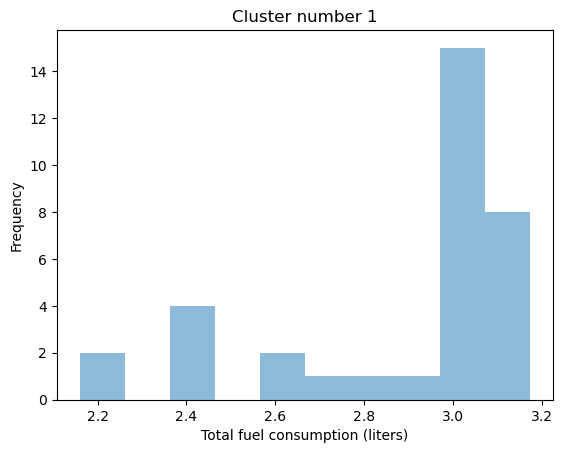

In [80]:
# Plot the histogram
cluster_number = 1
plt.hist(measurements[cluster_number], bins=10, alpha=0.5)
plt.title(f'Cluster number {cluster_number}')
plt.xlabel('Total fuel consumption (liters)')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [81]:
avg_measurements = [sum(meas)/len(meas) for meas in measurements]
print(avg_measurements)
print(estimates)

[0.7480408455473857, 2.8847616214869283, 2.7089053436038015]
[0.504071866879051, 2.7544649402668697, 2.6786990967170192]


In [ ]:
trips_fc_me = [get_total_fuel_consumption(trip["fc_me"],trip["timestamp"]) for trip in trips_0]

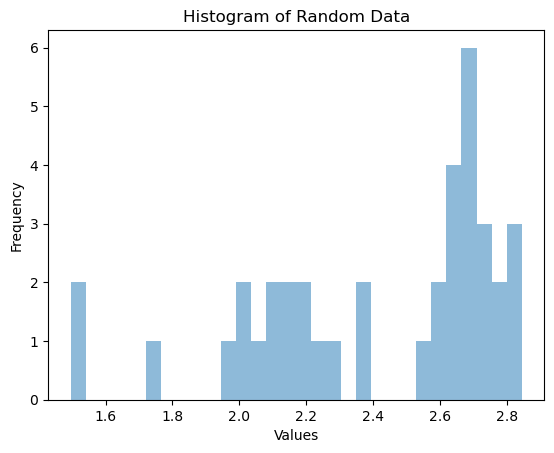

In [ ]:
# Plot the histogram
plt.hist(trips_fc_me, bins=30, alpha=0.5)
plt.title('Histogram of Random Data')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [ ]:
trips_0[0].keys()

dict_keys(['path', 'fc_ae', 'fc_me', 'sog', 'timestamp'])

In [ ]:
s = np.convolve(f, kernel, mode='valid')

In [ ]:
s

array([1.5, 2.5, 3.5, 4.5, 5.5])

In [ ]:
f[1:]*s

array([ 3. ,  7.5, 14. , 22.5, 33. ])